In [1]:
%matplotlib inline
import random
import os

import numpy as np
import pandas as pd
from matplotlib import pyplot as plt
import json

from sklearn.manifold import TSNE
from sklearn.cluster import DBSCAN

import seaborn as sns

import plotly.express as px

# Some helper functions for plotting annotated t-SNE visualizations

# TODO: adjust_text not available in kernels
try:
    from adjustText import adjust_text
except ImportError:
    def adjust_text(*args, **kwargs):
        pass

def adjust_text(*args, **kwargs):
    pass

def plot_bg(embs, bg_alpha=.01, figsize=(13, 9), emb_2d=None):
    """Create and return a plot of all our movie embeddings with very low opacity.
    (Intended to be used as a basis for further - more prominent - plotting of a 
    subset of movies. Having the overall shape of the map space in the background is
    useful for context.)
    """
    if emb_2d is None:
        emb_2d = embs
    fig, ax = plt.subplots(figsize=figsize)
    X = emb_2d[:, 0]
    Y = emb_2d[:, 1]
    ax.scatter(X, Y, alpha=bg_alpha)
    return ax

def add_annotations(embs, ax, label_indices, emb_2d=None, **kwargs):
    if emb_2d is None:
        emb_2d = embs
    X = emb_2d[label_indices, 0]
    Y = emb_2d[label_indices, 1]
    ax.scatter(X, Y, **kwargs)

def plot_with_annotations(embs, fig, df, column, label_indices, text=True, labels=None, alpha=1, **kwargs):
    ax = plot_bg(**kwargs)
    Xlabeled = embs[label_indices, 0]
    Ylabeled = embs[label_indices, 1]
    if labels is not None:
        for x, y, label in zip(Xlabeled, Ylabeled, labels):
            ax.scatter(x, y, alpha=alpha, label=label, marker='1',
                       s=90,
                      )
        fig.legend()
    else:
        ax.scatter(Xlabeled, Ylabeled, alpha=alpha, color='green')
    
    if text:
        # TODO: Add abbreviated title column
        titles = df.loc[label_indices, column].values
        texts = []
        for label, x, y in zip(titles, Xlabeled, Ylabeled):
            t = ax.annotate(label, xy=(x, y))
            texts.append(t)
        adjust_text(texts, 
                    #expand_text=(1.01, 1.05),
                    arrowprops=dict(arrowstyle='->', color='red'),
                   )
    return ax

FS = (13, 9)
def plot_region(df, column, x0, x1, y0, y1, text=True):
    """Plot the region of the mapping space bounded by the given x and y limits.
    """
    fig, ax = plt.subplots(figsize=FS)
    pts = df[
        (df.x >= x0) & (df.x <= x1)
        & (df.y >= y0) & (df.y <= y1)
    ]
    ax.scatter(pts.x, pts.y, alpha=.6)
    ax.set_xlim(x0, x1)
    ax.set_ylim(y0, y1)
    if text:
        texts = []
        for label, x, y in zip(pts[column].values, pts.x.values, pts.y.values):
            t = ax.annotate(label, xy=(x, y))
            texts.append(t)
        adjust_text(texts, expand_text=(1.01, 1.05))
    return ax

def plot_region_around(df, column, val, margin=5, **kwargs):
    """Plot the region of the mapping space in the neighbourhood of the the movie with
    the given title. The margin parameter controls the size of the neighbourhood around
    the movie.
    """
    xmargin = ymargin = margin
    match = df[df[column] == val]
    # assert len(match) == 1
    row = match.iloc[0]
    return plot_region(df, column, row.x-xmargin, row.x+xmargin, row.y-ymargin, row.y+ymargin, **kwargs)

In [2]:
N_NODES = 10000000

data = json.load(open('../graph_data/nodes.json'))
nodes = data['nodes']
nodes = pd.DataFrame(nodes)
non_duplicated_nodes = nodes[~nodes['text'].duplicated()].index.tolist()
nodes = nodes.iloc[non_duplicated_nodes]
nodes = nodes[:N_NODES]
nodes.shape

(77846, 8)

In [3]:
N_NODE = 3

nodes.iloc[N_NODE]

text          I've been working a lot of extra hours.
bot_id                                          bot_0
convai2_id                         train:ordered_3537
session_id                                  session_1
turn                                                4
place                                               0
split                                           train
id             train:ordered_3537:session_1:bot_0:4:0
Name: 5, dtype: object

In [4]:
embeddings = '../graph_data/nodes_embeddings.npy'

embeddings = np.load(embeddings)[non_duplicated_nodes][:N_NODES]

tsne = TSNE(random_state=1, n_iter=5000, metric="cosine", verbose=1)

tsne_embeddings = tsne.fit_transform(embeddings)

nodes['x'] = tsne_embeddings[:, 0]
nodes['y'] = tsne_embeddings[:, 1]

[t-SNE] Computing 91 nearest neighbors...
[t-SNE] Indexed 77846 samples in 0.015s...
[t-SNE] Computed neighbors for 77846 samples in 95.473s...
[t-SNE] Computed conditional probabilities for sample 1000 / 77846
[t-SNE] Computed conditional probabilities for sample 2000 / 77846
[t-SNE] Computed conditional probabilities for sample 3000 / 77846
[t-SNE] Computed conditional probabilities for sample 4000 / 77846
[t-SNE] Computed conditional probabilities for sample 5000 / 77846
[t-SNE] Computed conditional probabilities for sample 6000 / 77846
[t-SNE] Computed conditional probabilities for sample 7000 / 77846
[t-SNE] Computed conditional probabilities for sample 8000 / 77846
[t-SNE] Computed conditional probabilities for sample 9000 / 77846
[t-SNE] Computed conditional probabilities for sample 10000 / 77846
[t-SNE] Computed conditional probabilities for sample 11000 / 77846
[t-SNE] Computed conditional probabilities for sample 12000 / 77846
[t-SNE] Computed conditional probabilities for sa

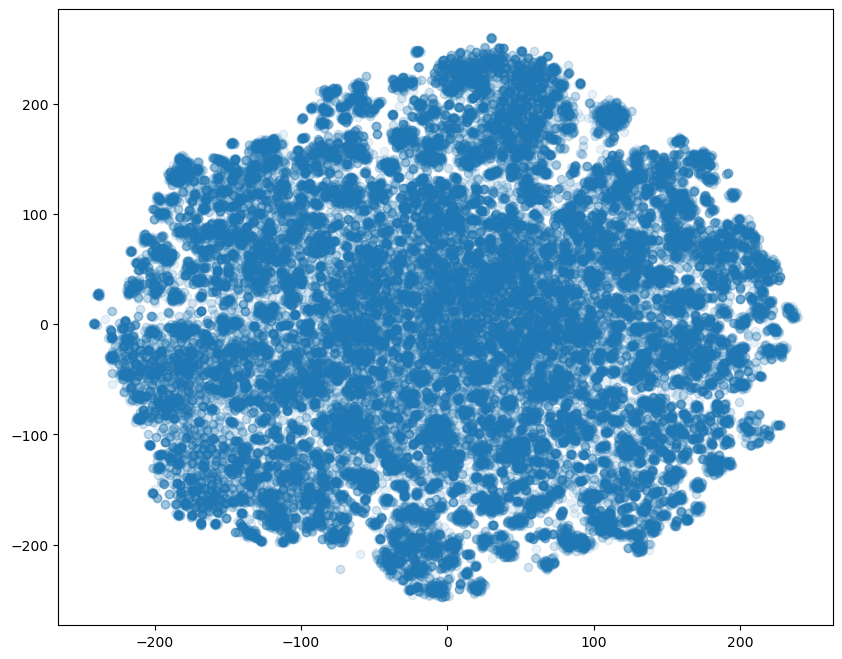

In [5]:
FS = (10, 8)
fig, ax = plt.subplots(figsize=FS)
# Make points translucent so we can visually identify regions with a high density of overlapping points
ax.scatter(tsne_embeddings[:, 0], tsne_embeddings[:, 1], alpha=.1);

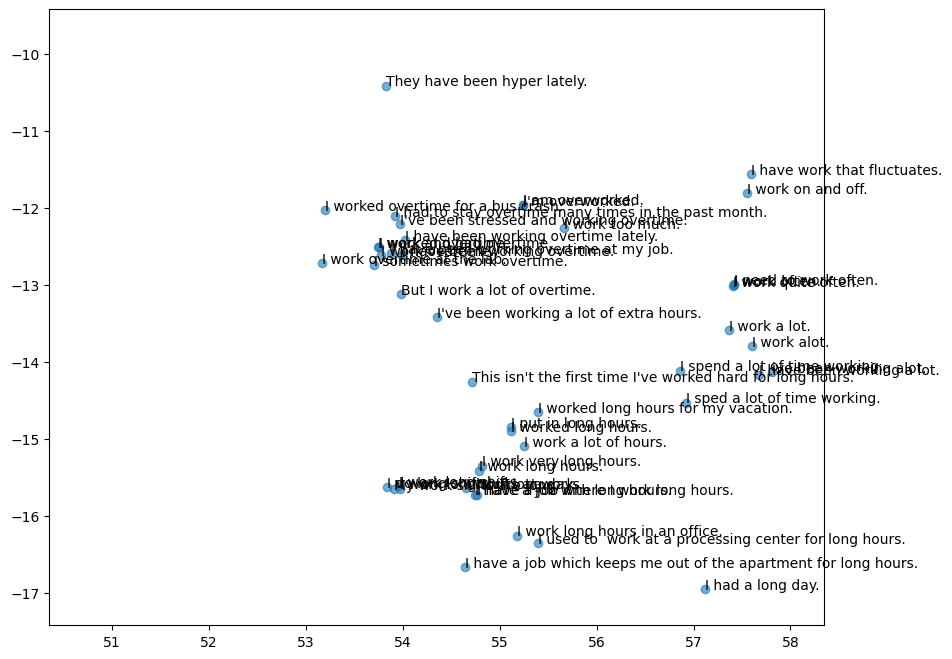

In [6]:
plot_region_around(nodes, 'text', "I've been working a lot of extra hours.", 4);

In [12]:
clusters = DBSCAN(eps=1., min_samples=2).fit_predict(tsne_embeddings)

nodes['clusters'] = clusters

In [13]:
nodes[nodes['clusters'] > -1].groupby('clusters')['id'].count().apply(lambda x: x*(x-1)/2).sum() * 0.01 / 60

115.446

In [14]:
px.scatter(x = "x", y = "y", hover_data=[nodes['text']], color = "clusters", data_frame=nodes)

In [19]:
nodes.loc[nodes['clusters'] > -1, ['id', 'clusters']].to_csv('../graph_data/cluster_nodes.csv', index=False)